In [1]:
import pandas as pd
import numpy as np
import re, os
import json
import matplotlib.pyplot as plt
%matplotlib notebook

In [2]:
def get_result_files_with_entry(PEDID, directory):
    """
    Get a list of result files in the specified directory that match the provided PEDID.

    Parameters:
    - PEDID (str): The PEDID to match in the file names.
    - directory (str): The directory where the result files are located.

    Returns:
    - matched_files (list of str): A list of file names that match the PEDID.
    """
    # Regular expression pattern to match filenames
    pattern = re.compile(rf'^{PEDID}_e(\d{{3}})_results\.txt$')
    
    # Iterate through the files in the directory and match the pattern
    matched_files = []
    for filename in os.listdir(directory):
        match = pattern.match(filename)
        if match:
            matched_files.append(filename)
    
    return matched_files

In [3]:
def find_total_range(ranges):
    """
    Find the total range of a list of ranges.

    Parameters:
    - ranges (list of tuples): List of (start, end) ranges.

    Returns:
    - total_range (list): A list representing the minimum start and maximum end of the input ranges.
    """
    if not ranges:
        return None

    min_start = min(ranges, key=lambda x: x[0])[0]
    max_end = max(ranges, key=lambda x: x[1])[1]

    return [min_start, max_end]

def find_missing_regions(ranges):
    """
    Find missing regions within a total range and given ranges.

    Parameters:
    - ranges (list of tuples): List of (start, end) ranges.

    Returns:
    - total_range (list): A list representing the minimum start and maximum end of the input ranges.
    - missing_regions (list of tuples): List of (start, end) ranges representing missing regions between the input ranges.
    """
    total_range = find_total_range(ranges)
    if total_range is None:
        return None

    missing_regions = []
    current_start = total_range[0]

    for start, end in ranges:
        if start > current_start:
            missing_regions.append([current_start, start - 1])
        current_start = end + 1

    if current_start <= total_range[1]:
        missing_regions.append([current_start, total_range[1]])

    return total_range, missing_regions


In [4]:
def plot_disorder_entanglement(PEDID):
    """
    Plot disorder and entanglement information for a given PEDID.

    Parameters:
    - PEDID (str): The PEDID to plot.
    - disorder_information (list of dict): A list of dictionaries containing disorder information.

    Returns:
    None
    """
    # read pdb information
    with open('../mapping_disorder_uniprot_pdb/pdb_information.json', "r") as json_file:
        disorder_information = json.load(json_file)

    # Find the matching entries for the given PEDID
    matching_entries = [entry for entry in disorder_information if entry.get('entry') == PEDID]
    data1 = matching_entries[0]  # This is always 1 entry

    # Display entry information
#     print(f"Entry information\n{data1}")

    # Define the pdb_indices range for Plot 2
    pdb_indices = data1['pdb_indices']
    total_range, missing_regions = find_missing_regions(pdb_indices)

    # Create a dictionary to keep track of entanglement counts for each residue
    # This will include missing residues as well; we will set the probability of missing residues back to 0 at the final step
    entanglement_counts = {i: 0 for i in range(total_range[0], total_range[1] + 1)}

    # Read and process the data file using NumPy for Plot
    results_files = get_result_files_with_entry(PEDID, "entanglement_results/")
    threshold = 0.6  # Max(Gc) threshold for entanglement
    all_results_data = []

    for filename in results_files:
        data = np.loadtxt(f"entanglement_results/{filename}", skiprows=1, usecols=(1, 2, 3, 4, 5), ndmin=2)
        all_results_data.append(data)

    # Combine the data from all files into a single NumPy array
    entanglement_results = np.concatenate(all_results_data, axis=0)  # Use np.vstack for vertical stacking

    for row in entanglement_results:
        i1, i2, j1, j2, max_gc = row
        if max_gc >= threshold:
            for residue in range(int(i1), int(i2) + 1):
                entanglement_counts[residue] += 1
            for residue in range(int(j1), int(j2) + 1):
                entanglement_counts[residue] += 1

    # Calculate the probability of entanglement for each residue
    total_frames = len(entanglement_results)
    residue_probabilities = {residue: count / total_frames for residue, count in entanglement_counts.items()}

    # Set the residue probability of missing residue back to 0 (meaning they do not exist)
    for region in missing_regions:
        for i in range(region[0], region[1] + 1):
            residue_probabilities[i] = 0

    # Extract residues and probabilities
    residues, probabilities = zip(*sorted(residue_probabilities.items()))

    # Create a plot
    fig, ax = plt.subplots(figsize=(5, 4))

    # Plot the disorder regions from data1 with different line styles
    disorder_regions = data1['disorder_regions']
    for region in disorder_regions:
        x1, x2 = region
        ax.fill_between([x1, x2], 0, 1.1, color='red', alpha=0.3)

    # Plot the linker regions from data1 with different line styles
    linker_regions = data1['linker']
    for region in linker_regions:
        x1, x2 = region
        ax.fill_between([x1, x2], 0, 1.1, color='blue', alpha=0.3)

    # Filled with black color for missing region in PDB
    for region in missing_regions:
        x1, x2 = region
        ax.fill_between([x1 - 1, x2], 0, 1.1, color='black', alpha=0.3)

    # Plot the probabilities of entanglement from data2
    ax.plot(residues, probabilities, color='black', linewidth=2)

    # Set x-ticks to be the start and end of each region from data1
    x_ticks = [x1 for x1, _ in disorder_regions] + [x2 for _, x2 in disorder_regions] + [x1 for x1, _ in linker_regions] + [x2 for _, x2 in linker_regions] + [x1 for x1, _ in missing_regions] + [x2 for _, x2 in missing_regions] + total_range
    x_ticks = list(set(x_ticks))  # Remove duplicates
    x_ticks.sort()  # Sort the x-ticks

    # Set x-tick labels
    x_tick_labels = [str(int(x)) for x in x_ticks]

    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_tick_labels, rotation=45)  # Rotate the labels for better visibility

    # Set plot limits
    x_min, x_max = total_range[0], total_range[1]
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(0, 1.01)  # Adjust the y-limits as needed

    # Add a legend to differentiate line styles
    ax.legend()
    plt.xlabel('Residue')
    plt.ylabel('Probability of Entanglement')
    if missing_regions:
        title = f"{data1['entry']}\n pdb_indices:{data1['pdb_indices']}\n missing:{missing_regions}\n linkers/tags:{data1['linker']}\n disorders: {data1['disorder_regions']}"
    else:
        title = f"{data1['entry']}\n pdb_indices:{data1['pdb_indices']}\n linkers/tags:{data1['linker']}\n disorders: {data1['disorder_regions']}"
    plt.title(title)

    # Add this line to set the layout tight
    plt.tight_layout()

    # Save the plot as an image
    plt.savefig(f"Figs/{PEDID}.png", dpi=300)

    # Display the plot
    plt.show()

# Usage example:
# plot_disorder_entanglement("your_PEDID_here", your_disorder_information_list)


# Read short IDR data

In [5]:
short_idr = pd.read_pickle('short_idr.pkl')

In [6]:
short_idr

,ped_id,number_of_chains,protein_name,length_in_ped,uniprot_acc,length_in_uniprot,disorder_region_from_mobi,pdb_region,length_of_idr,class,exp_method,number_of_entangled_frames,total_frames,note,entangled_population
466,PED00387,1.0,Repressor Rok,103.0,O34857,191,"([1, 13], [31, 108])","(97, 191)","[0, 12]",Short IDR,NMR,20.0,20.0,NaN,1.0
437,PED00365_B,NaN,PBCV-1 histone H3-Lys 27 methyltransferase,120.0,O41094,119,"([106, 119],)","(1, 119)",[14],Short IDR,NMR,20.0,20.0,NaN,1.0
486,PED00400,1.0,Autophagy-related protein 32,145.0,P40458,529,"([1, 216], [342, 399], [413, 485], [491, 529])","(200, 341)","[17, 0, 0, 0]",Short IDR,NMR,20.0,20.0,NaN,1.0
318,PED00268,1.0,PP1R8/NIPP1,132.0,Q8R3G1,351,"([1, 10], [133, 351])","(1, 132)","[10, 0]",Short IDR,NMR,20.0,20.0,NaN,1.0
481,PED00397,1.0,CD44 antigen,158.0,P16070,742,"([1, 14], [161, 658], [661, 742])","(21, 178)","[0, 18, 0]",Short IDR,NMR,20.0,20.0,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317,PED00267,1.0,WBP4/FBP21,75.0,O75554,376,"([1, 7], [83, 129], [157, 169], [183, 376])","(122, 196)","[0, 8, 13, 14]",Short IDR,NMR,0.0,20.0,NaN,0.0
305,PED00256_B,NaN,U1 small nuclear ribonucleoprotein 70 kDa,21.0,P17133,448,"([1, 75], [188, 414], [426, 448])","(405, 425)","[0, 10, 0]",Short IDR,NMR,0.0,28.0,NaN,0.0
299,PED00251,1.0,MBP,36.0,P04370-5,169,[ID does not exist in Database],"(73, 108)",NaN,Short IDR,NMR,0.0,10.0,manually assigned,0.0
297,PED00250_A,NaN,HOX-C9,60.0,P31274,260,"([1, 197], [253, 260])","(192, 251)","[6, 0]",Short IDR,NMR,0.0,10.0,NaN,0.0


In [11]:
# select all short_IDR that have entangled conformation only.
short_idr_entangled = short_idr[short_idr['entangled_population']>0]

In [16]:
# export short IDR with entanglement to excel file
short_idr_entangled.to_excel('short_idr_entangled.xlsx')

In [12]:
short_idr_entangled['ped_id'].tolist()

['PED00387',
 'PED00365_B',
 'PED00400',
 'PED00268',
 'PED00397',
 'PED00261',
 'PED00260',
 'PED00396',
 'PED00253',
 'PED00247',
 'PED00106',
 'PED00108',
 'PED00110',
 'PED00111',
 'PED00246_A',
 'PED00392_B',
 'PED00392_A',
 'PED00350',
 'PED00367_A',
 'PED00365_A',
 'PED00059',
 'PED00343',
 'PED00340',
 'PED00356_A',
 'PED00041',
 'PED00336',
 'PED00414',
 'PED00057_A',
 'PED00325',
 'PED00412',
 'PED00323_C',
 'PED00319',
 'PED00284',
 'PED00086',
 'PED00385',
 'PED00361_A',
 'PED00087_A',
 'PED00058',
 'PED00361_B',
 'PED00021_B',
 'PED00254',
 'PED00092_A',
 'PED00402_B',
 'PED00347_A',
 'PED00352',
 'PED00353_A',
 'PED00098_A',
 'PED00097_A']

# Print out disorder information of short IDR

In [13]:
list_of_short_idr = short_idr['ped_id'].tolist() #get entry name of all short IDR
list_of_short_idr_entangled = short_idr_entangled['ped_id'].tolist() # entry name of short IDR with entangled only
# read json file
with open('../mapping_disorder_uniprot_pdb/pdb_information.json', "r") as json_file:
        disorder_information = json.load(json_file)
        
for PEDID in list_of_short_idr:
    matching_entries = [entry for entry in disorder_information if entry.get('entry') == PEDID]
    print(matching_entries[0]) #this is always 1 entry


{'entry': 'PED00387', 'linker': [[192, 199]], 'disorder_regions': [[97, 108]], 'pdb_indices': [[97, 199]]}
{'entry': 'PED00365_B', 'linker': [], 'disorder_regions': [[106, 119]], 'pdb_indices': [[1, 302]]}
{'entry': 'PED00400', 'linker': [[1, 3]], 'disorder_regions': [[4, 20]], 'pdb_indices': [[1, 145]]}
{'entry': 'PED00268', 'linker': [], 'disorder_regions': [[1, 10]], 'pdb_indices': [[1, 132]]}
{'entry': 'PED00397', 'linker': [[21, 21]], 'disorder_regions': [[161, 178]], 'pdb_indices': [[21, 178]]}
{'entry': 'PED00261', 'linker': [[95, 96]], 'disorder_regions': [[1, 10]], 'pdb_indices': [[1, 96]]}
{'entry': 'PED00260', 'linker': [[95, 96]], 'disorder_regions': [[1, 10]], 'pdb_indices': [[1, 96]]}
{'entry': 'PED00396', 'linker': [[149, 152]], 'disorder_regions': [[153, 164]], 'pdb_indices': [[149, 281]]}
{'entry': 'PED00253', 'linker': [[168, 174]], 'disorder_regions': [[14, 23], [64, 77], [151, 160]], 'pdb_indices': [[1, 174]]}
{'entry': 'PED00247', 'linker': [], 'disorder_regions': 

<IPython.core.display.Javascript object>


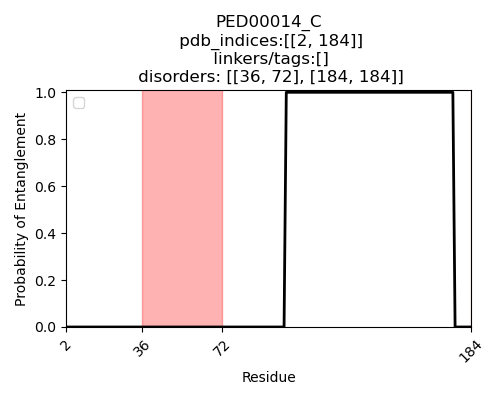

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [9]:
plot_disorder_entanglement("PED00014_C")

<IPython.core.display.Javascript object>


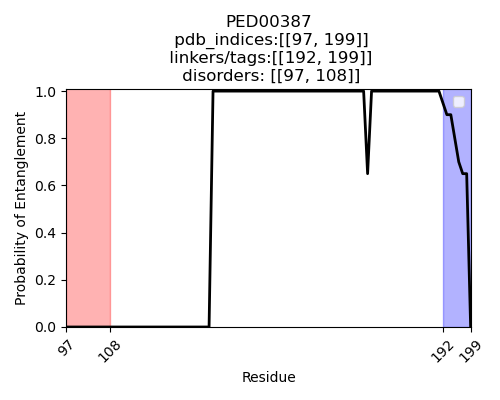

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


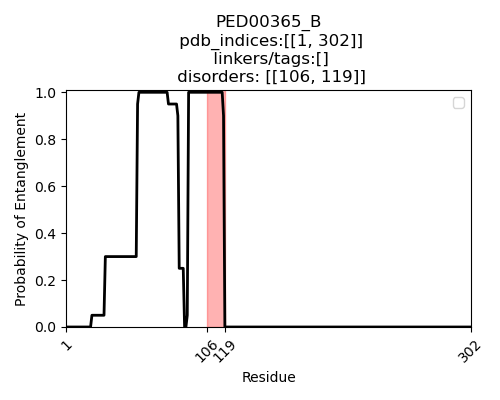

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


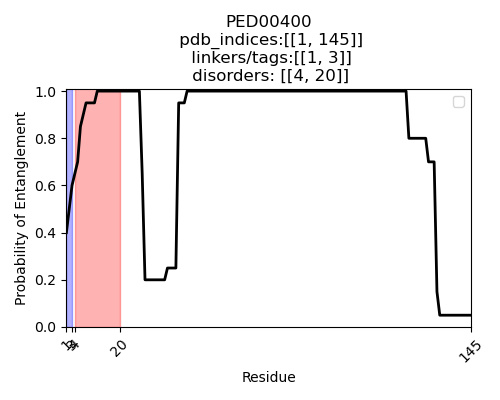

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


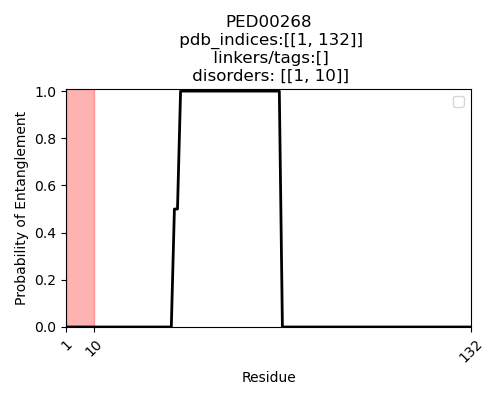

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


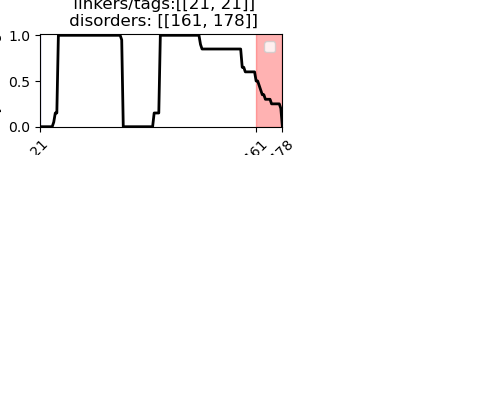

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


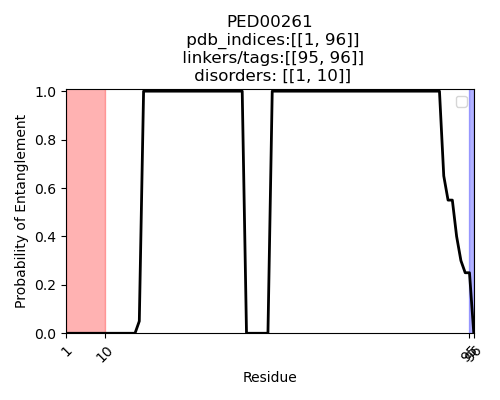

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


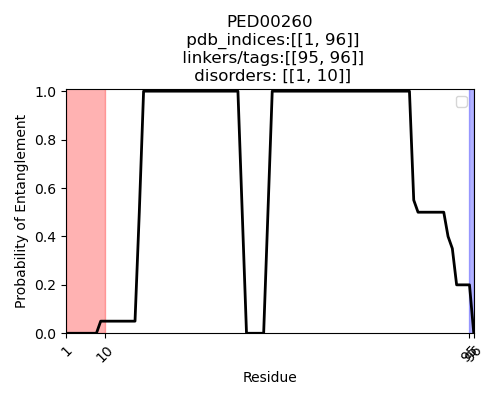

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


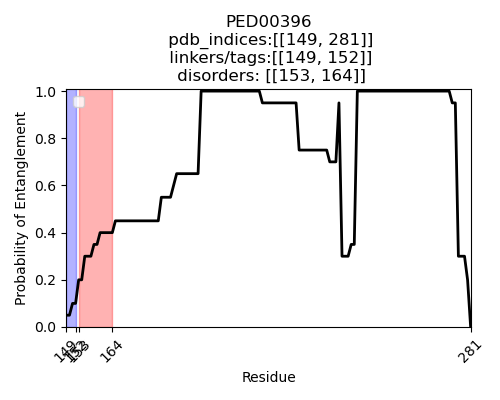

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


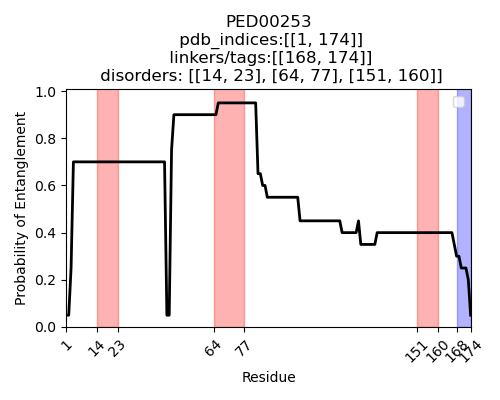

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


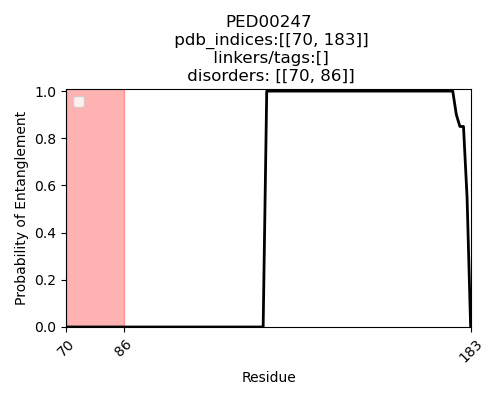

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


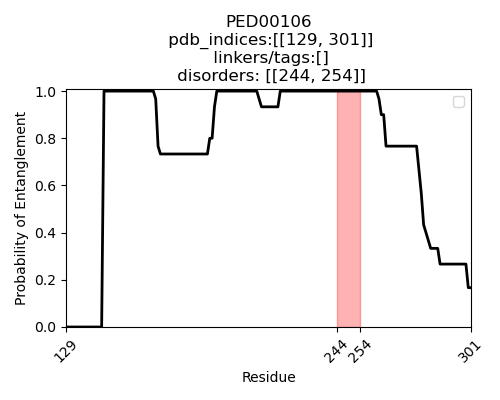

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


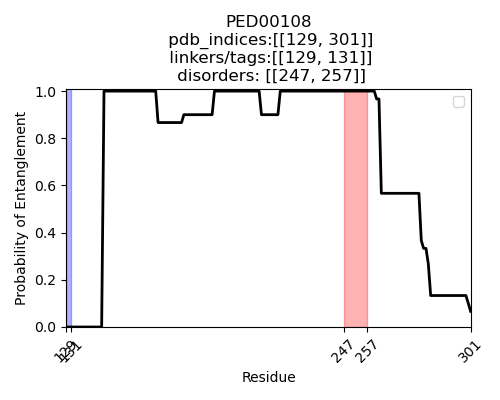

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


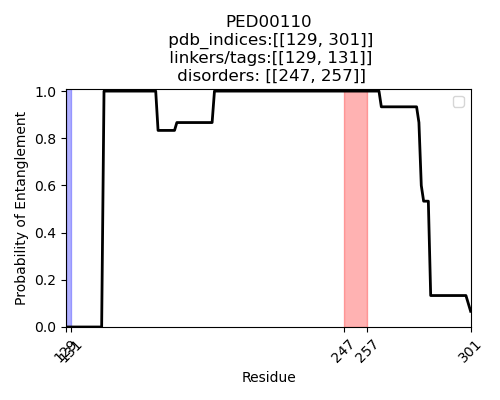

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


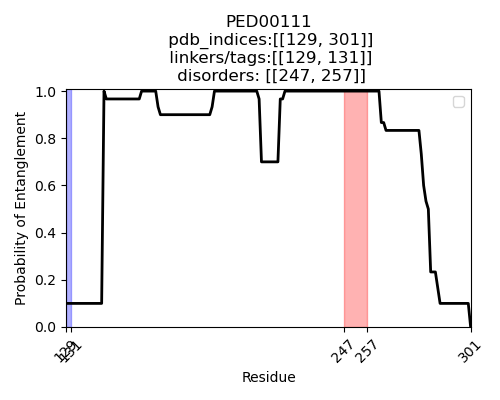

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


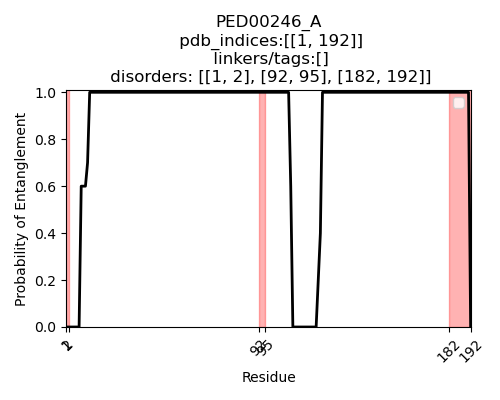

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


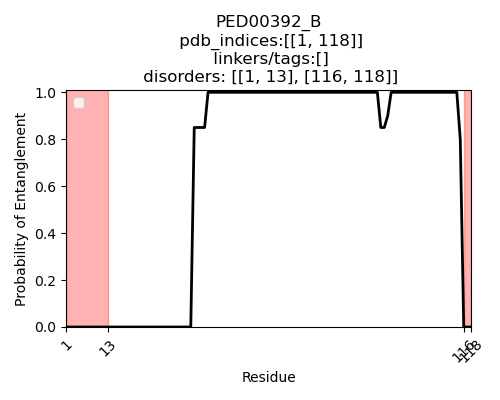

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


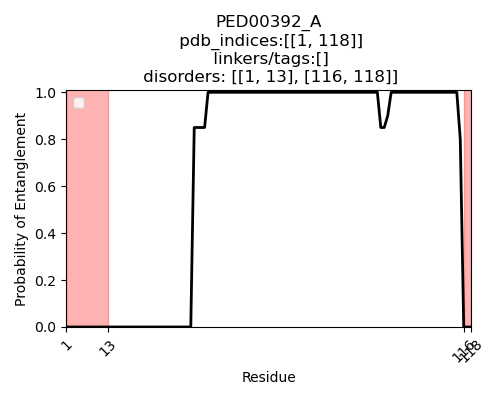

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


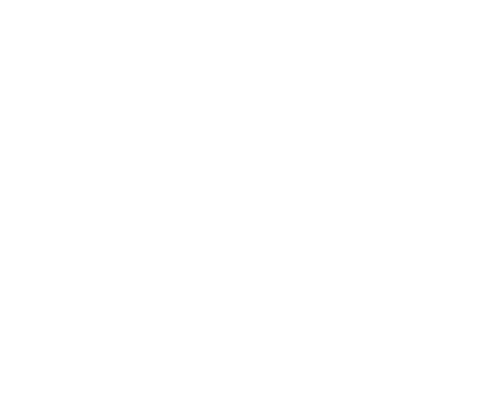

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/tmp/ipykernel_46635/41910851.py:64: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(5, 4))


<IPython.core.display.Javascript object>


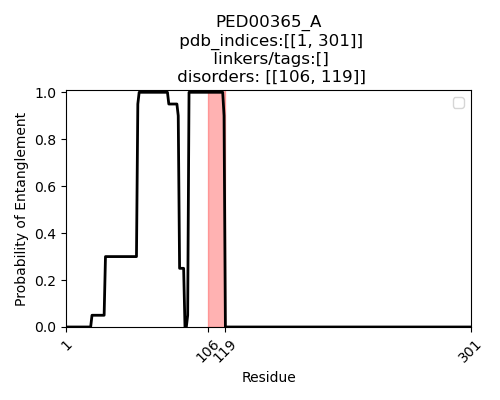

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


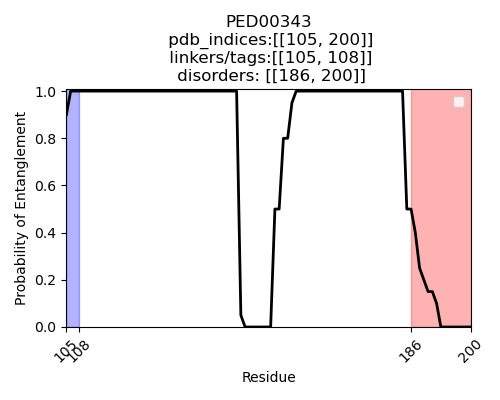

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


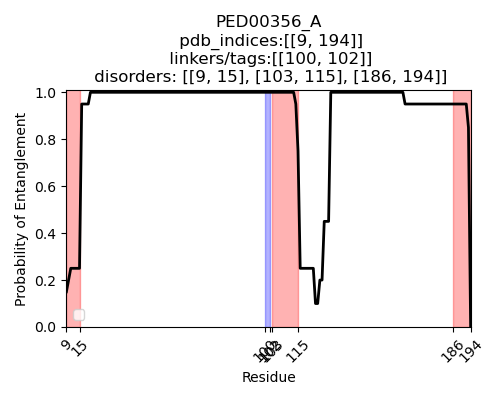

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


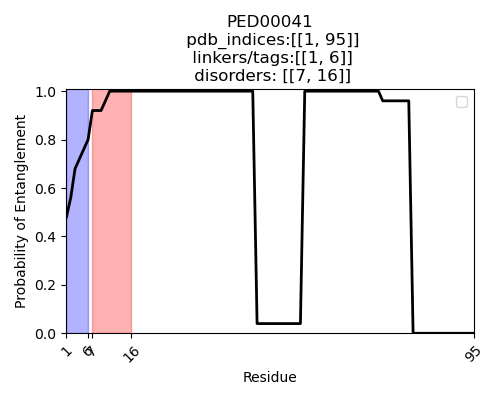

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


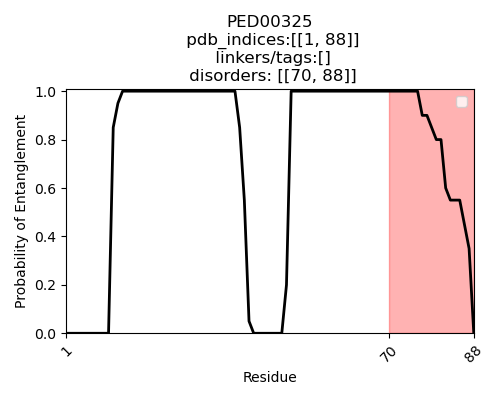

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


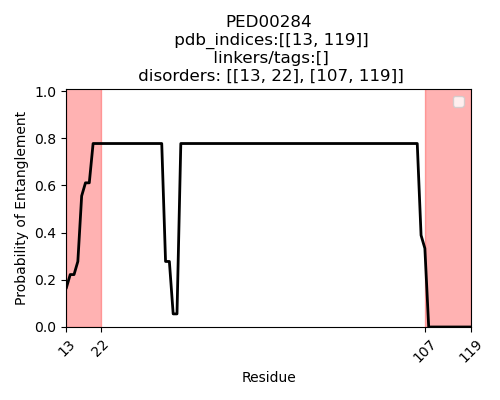

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


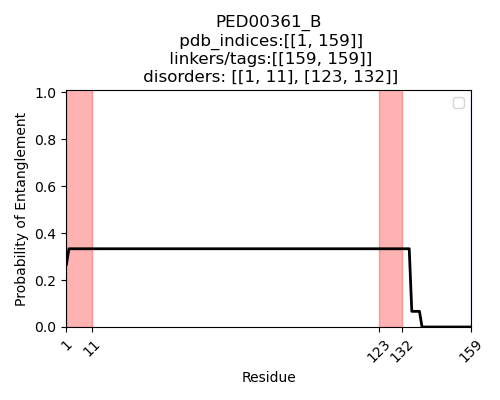

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


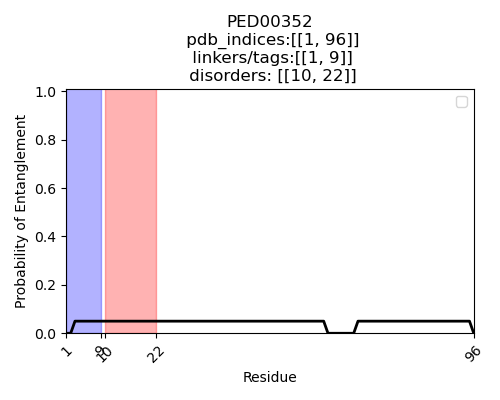

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


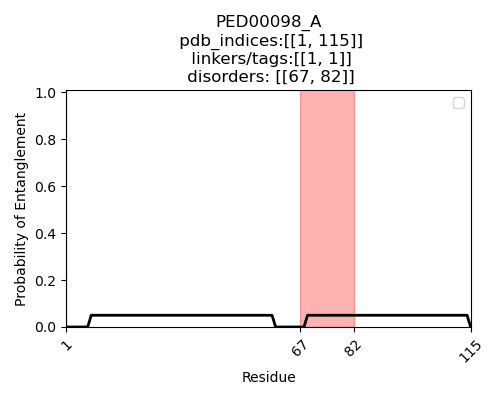

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


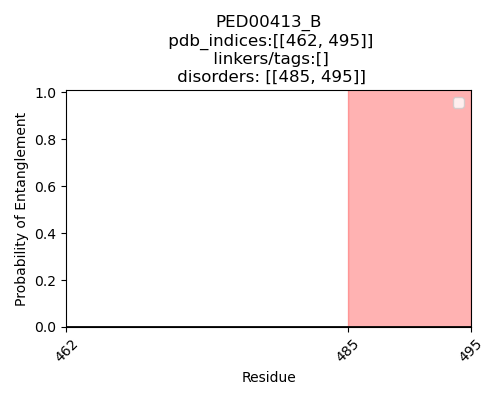

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


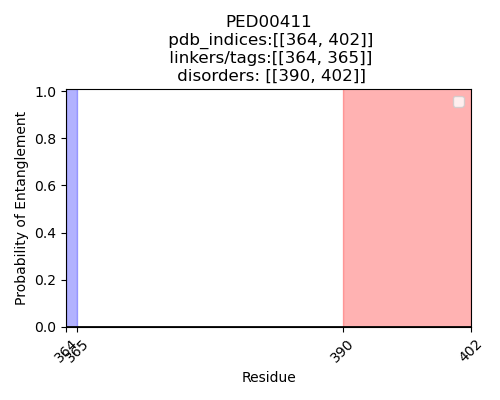

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


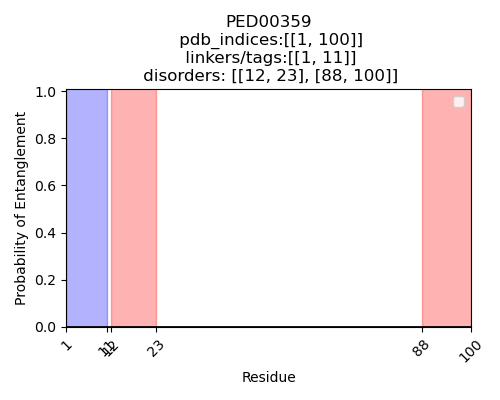

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


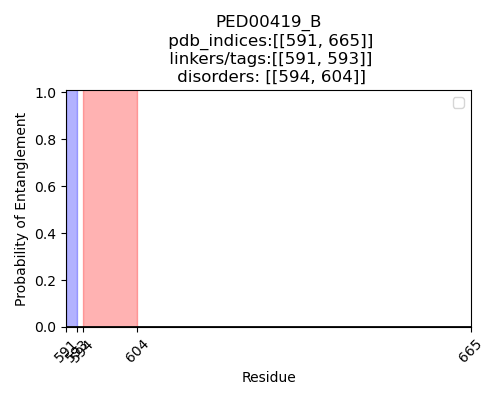

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


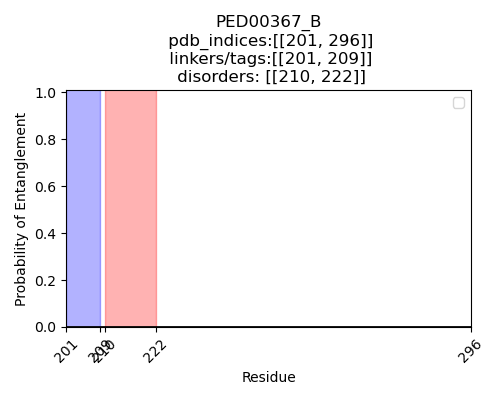

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


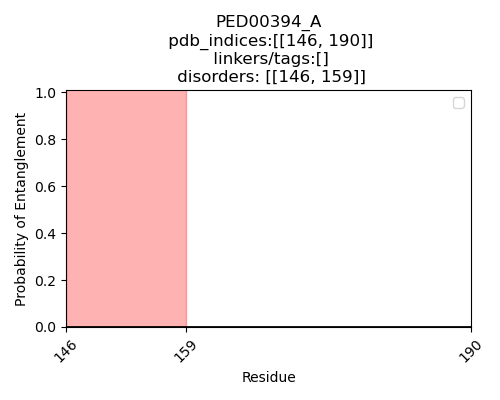

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


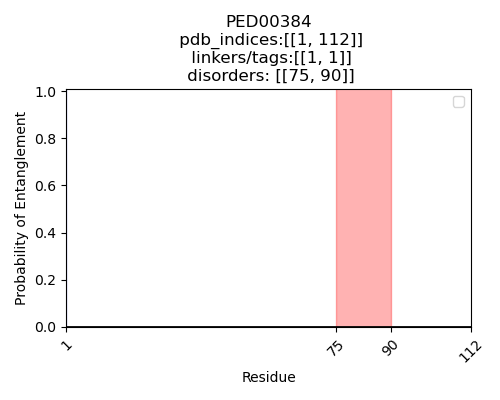

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


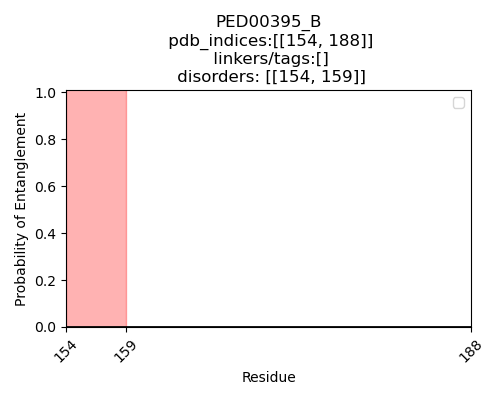

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


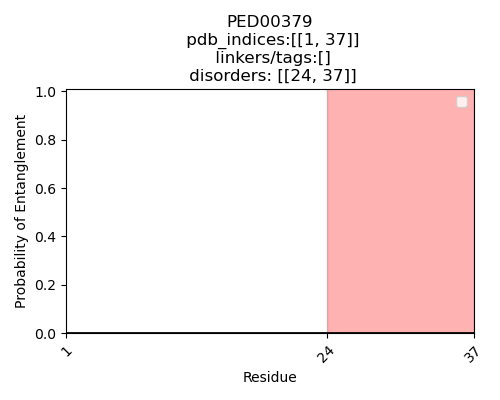

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


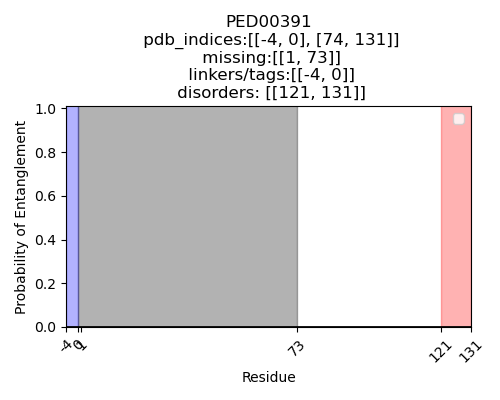

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


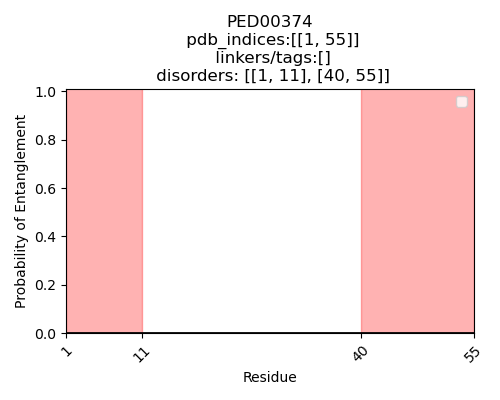

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


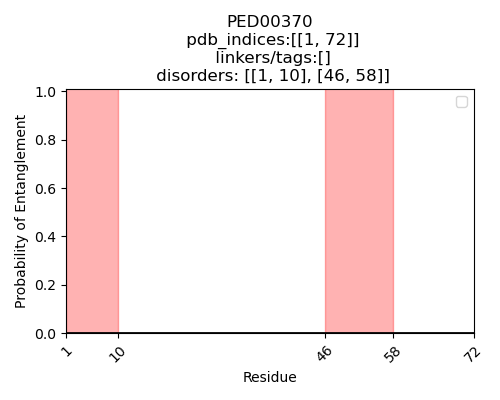

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


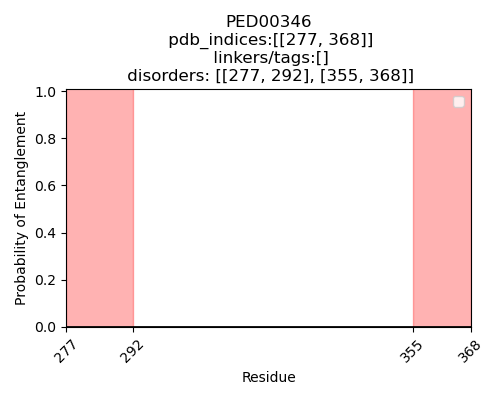

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


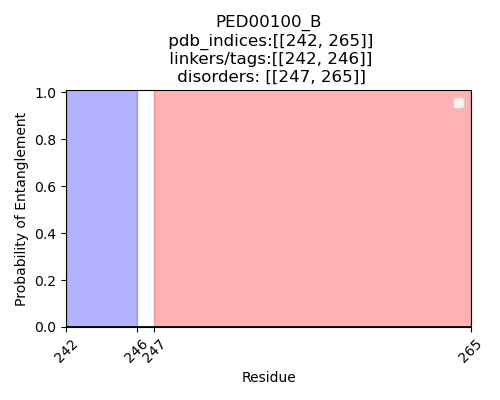

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


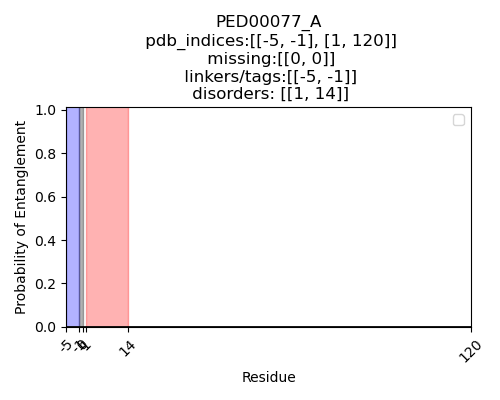

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


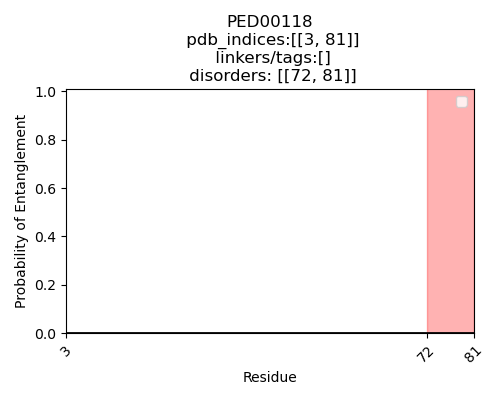

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


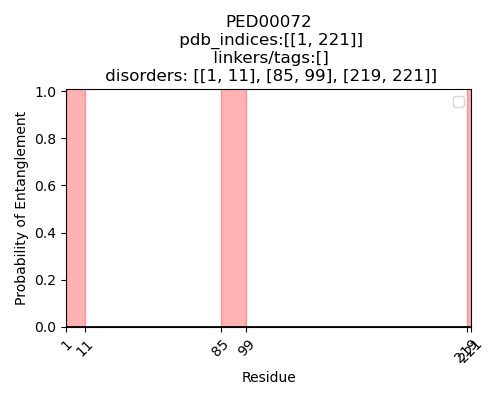

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


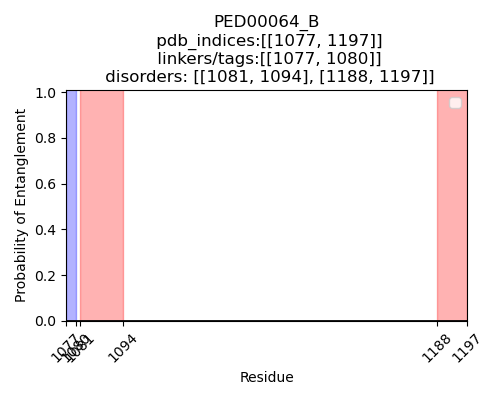

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


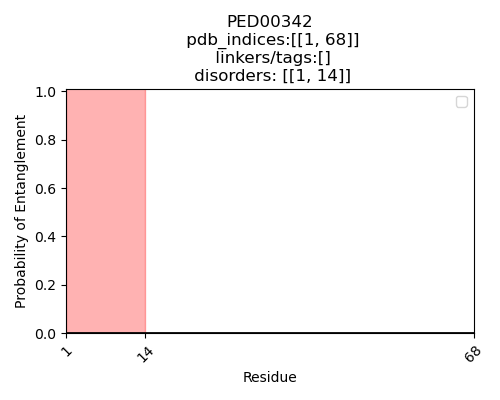

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


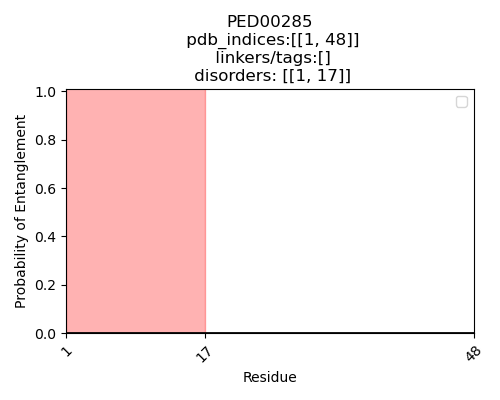

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


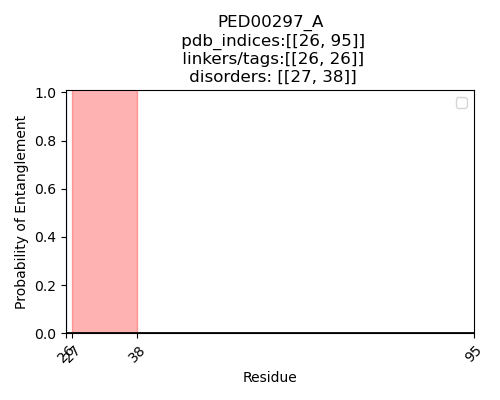

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


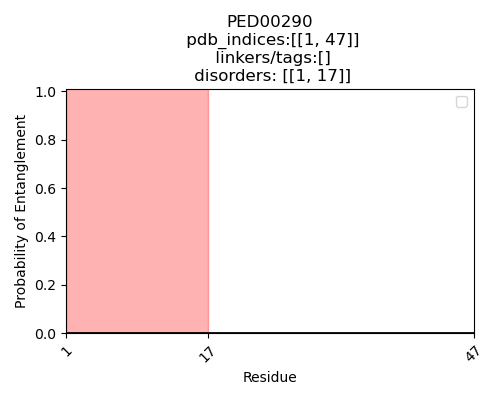

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


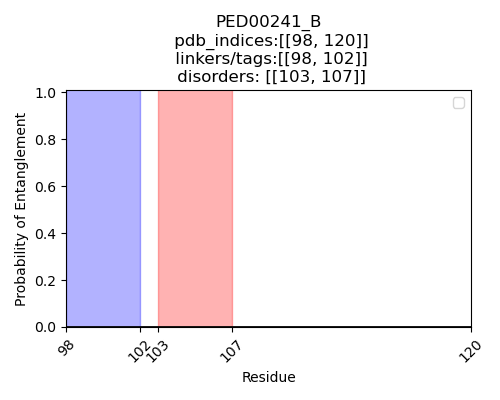

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


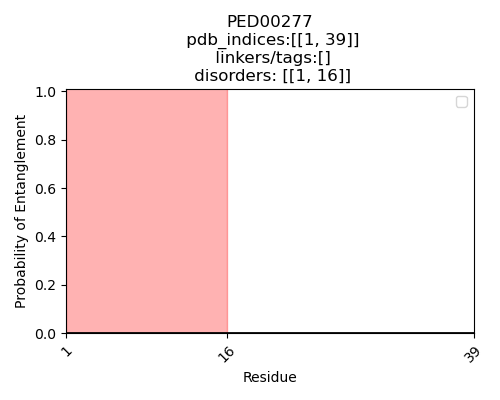

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


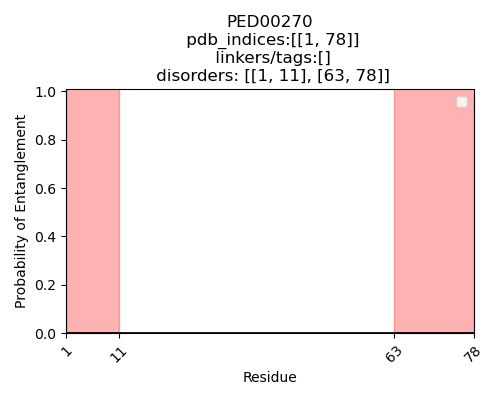

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


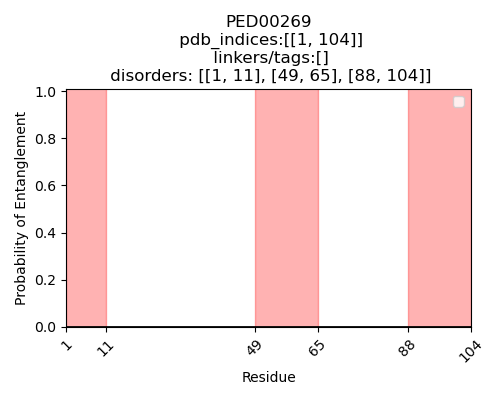

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [21]:
for PEDID in list_of_short_idr:
    plot_disorder_entanglement(PEDID)

In [11]:
for PEDID in list_of_short_idr:
    matching_entries = [entry for entry in disorder_information if entry.get('entry') == "PED00014_C"]
    print(matching_entries[0]) #this is always 1 entry

{'entry': 'PED00014_C', 'linker': [], 'disorder_regions': [[36, 72], [184, 184]], 'pdb_indices': [[2, 184]]}
{'entry': 'PED00014_C', 'linker': [], 'disorder_regions': [[36, 72], [184, 184]], 'pdb_indices': [[2, 184]]}
{'entry': 'PED00014_C', 'linker': [], 'disorder_regions': [[36, 72], [184, 184]], 'pdb_indices': [[2, 184]]}
{'entry': 'PED00014_C', 'linker': [], 'disorder_regions': [[36, 72], [184, 184]], 'pdb_indices': [[2, 184]]}
{'entry': 'PED00014_C', 'linker': [], 'disorder_regions': [[36, 72], [184, 184]], 'pdb_indices': [[2, 184]]}
{'entry': 'PED00014_C', 'linker': [], 'disorder_regions': [[36, 72], [184, 184]], 'pdb_indices': [[2, 184]]}
{'entry': 'PED00014_C', 'linker': [], 'disorder_regions': [[36, 72], [184, 184]], 'pdb_indices': [[2, 184]]}
{'entry': 'PED00014_C', 'linker': [], 'disorder_regions': [[36, 72], [184, 184]], 'pdb_indices': [[2, 184]]}
{'entry': 'PED00014_C', 'linker': [], 'disorder_regions': [[36, 72], [184, 184]], 'pdb_indices': [[2, 184]]}
{'entry': 'PED00014

<IPython.core.display.Javascript object>


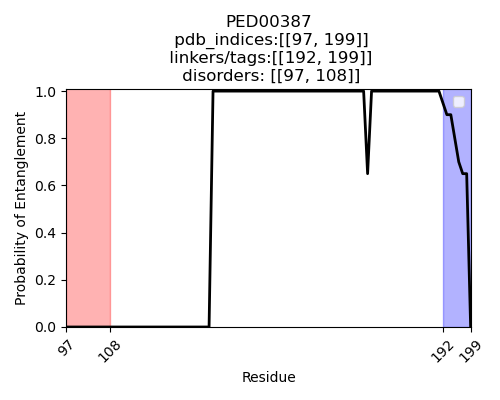

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


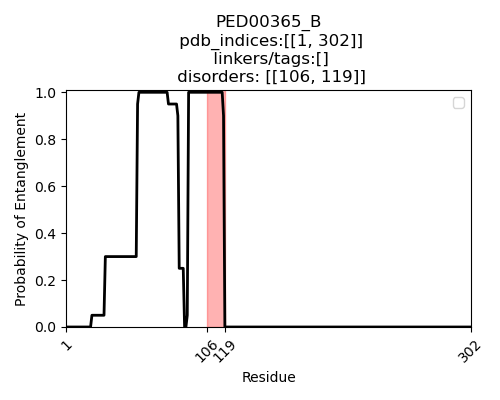

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


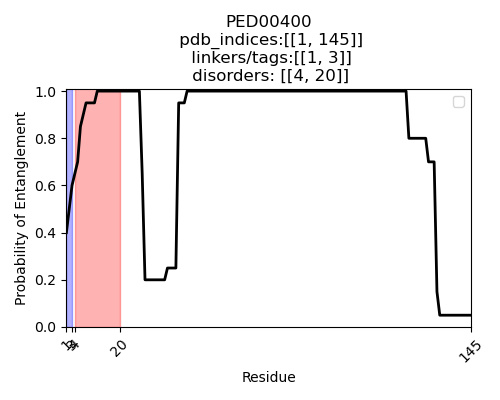

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


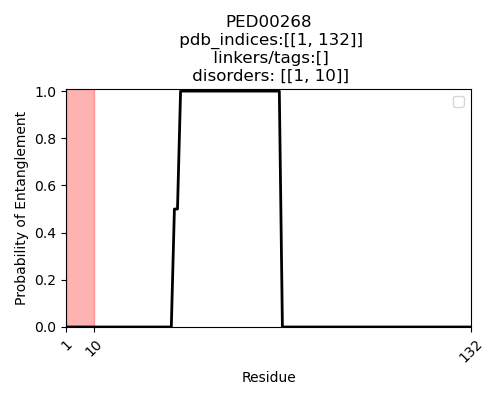

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


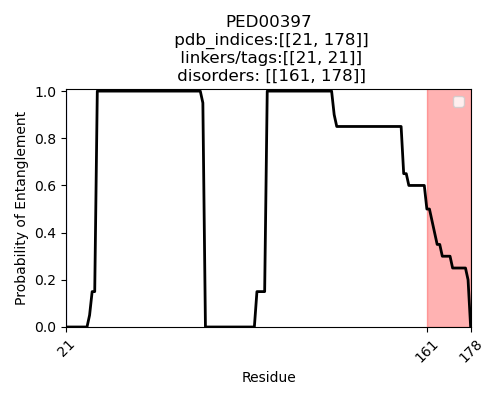

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


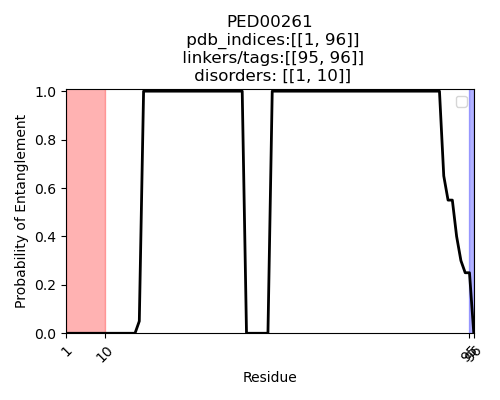

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


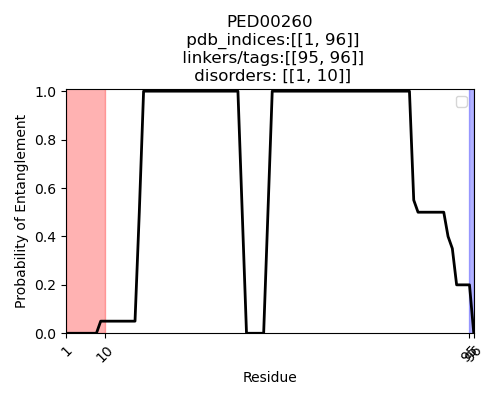

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


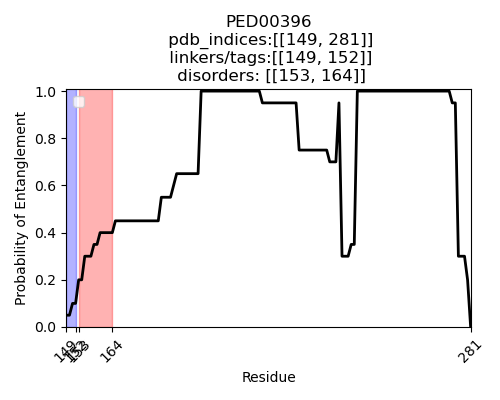

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


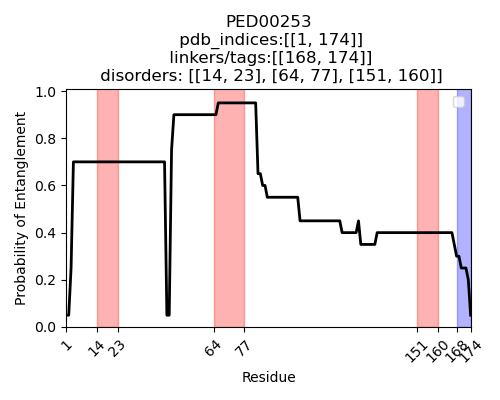

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


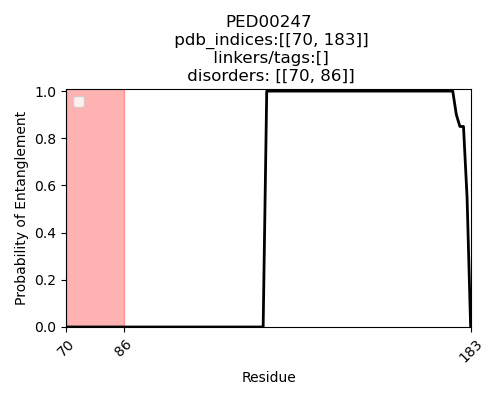

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


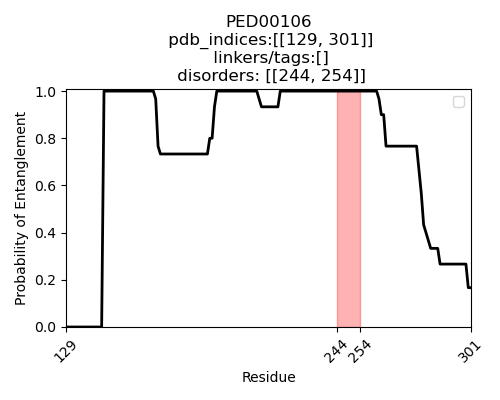

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


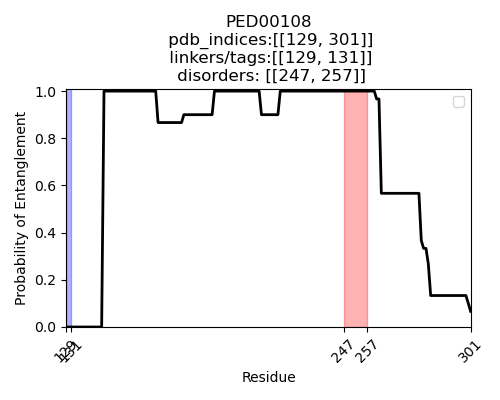

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


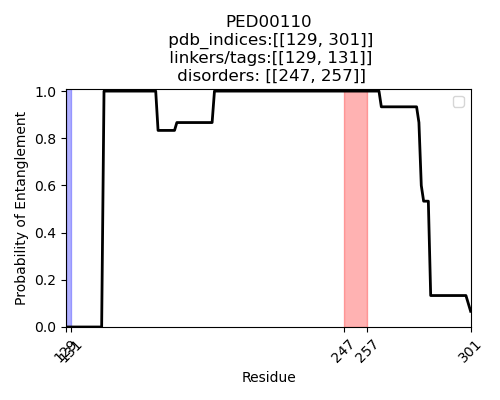

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


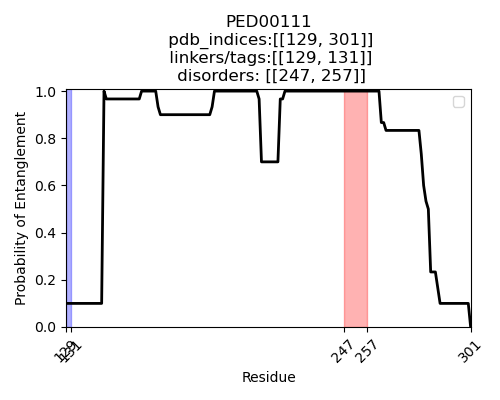

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


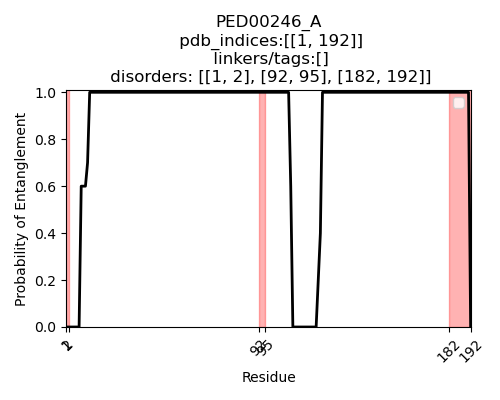

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


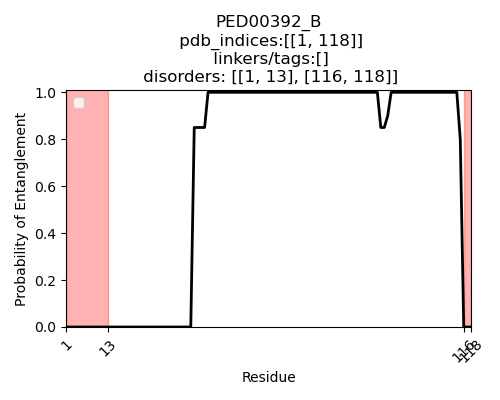

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


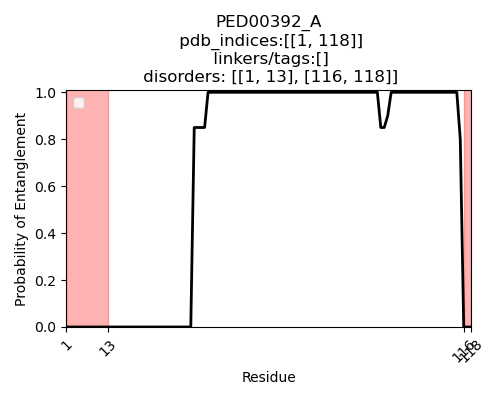

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


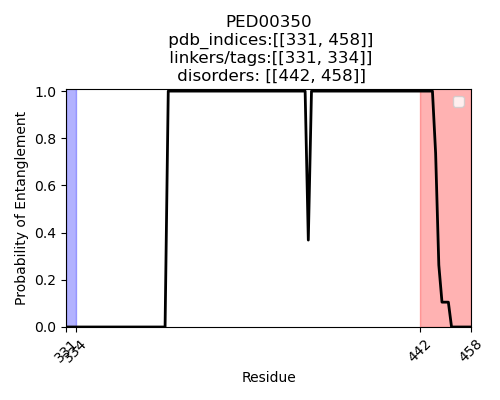

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


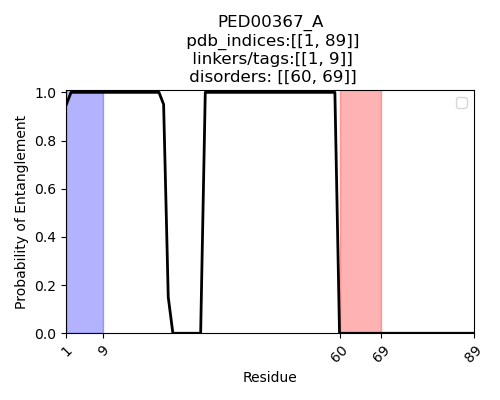

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


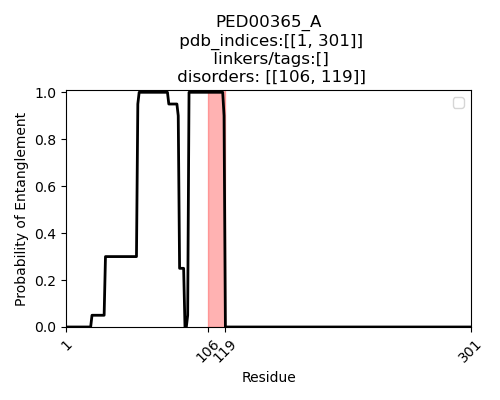

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/tmp/ipykernel_3158/41910851.py:64: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(5, 4))


<IPython.core.display.Javascript object>


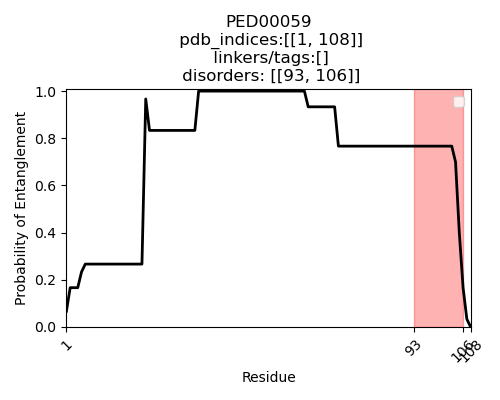

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


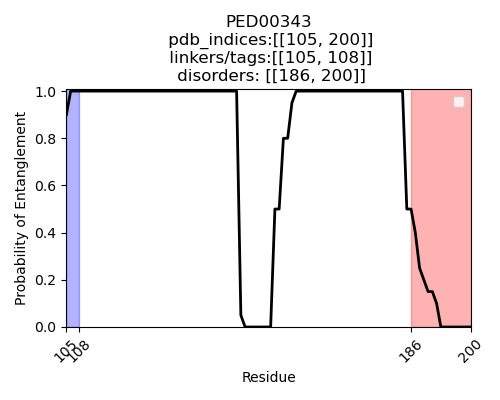

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


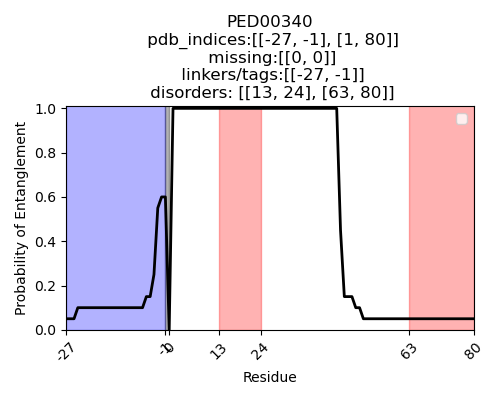

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


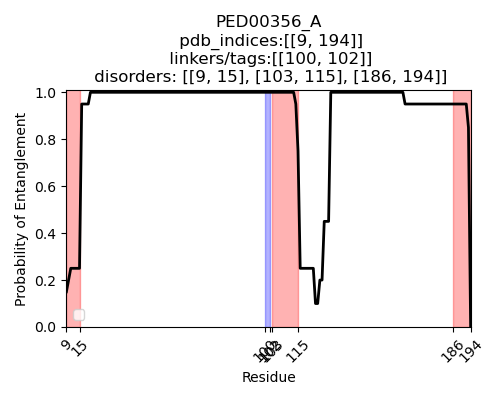

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


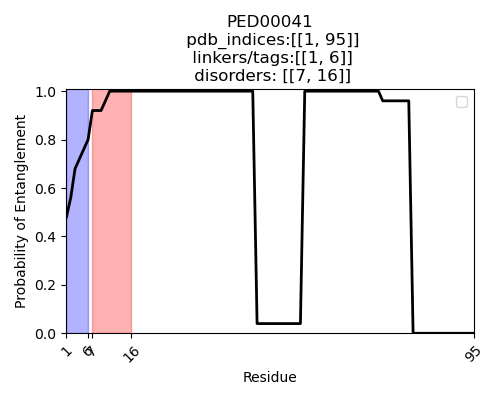

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


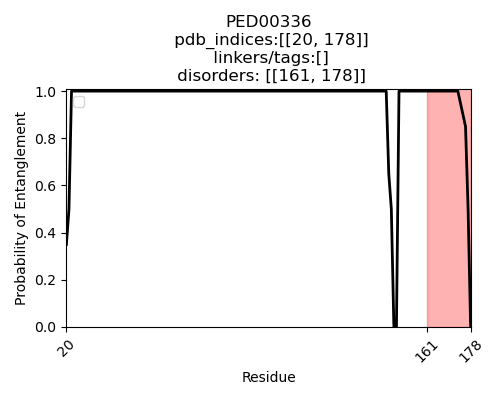

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


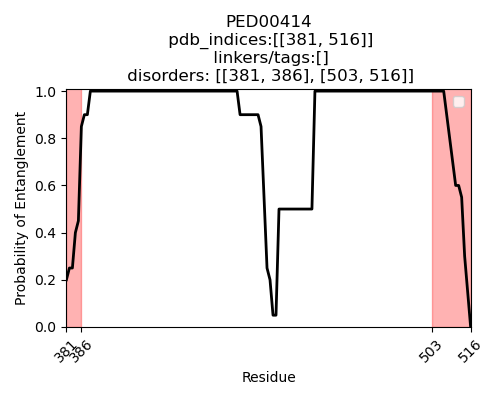

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


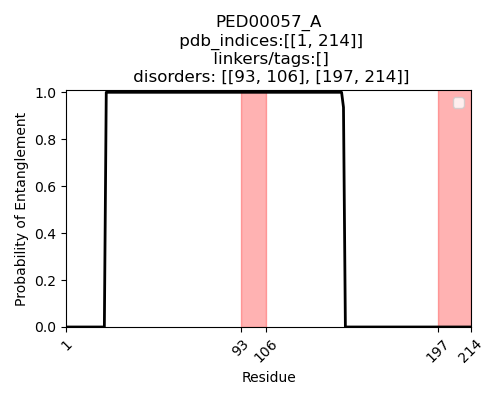

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


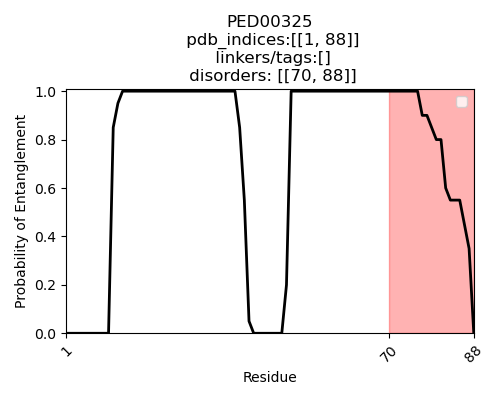

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


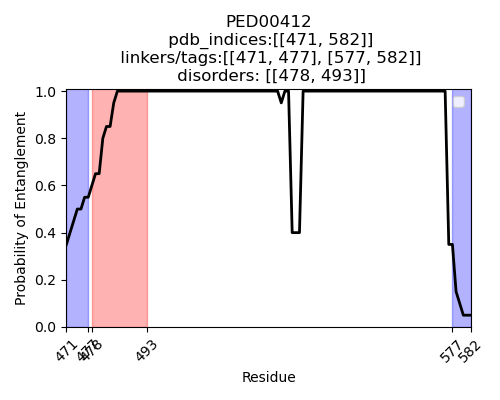

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


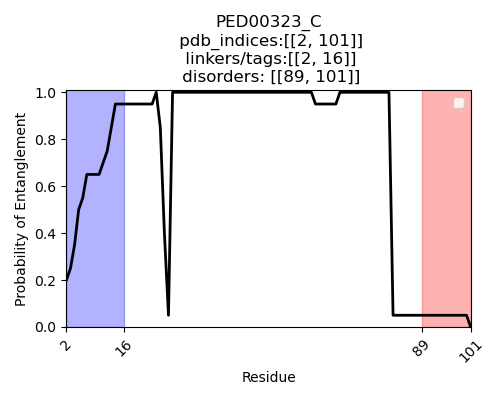

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


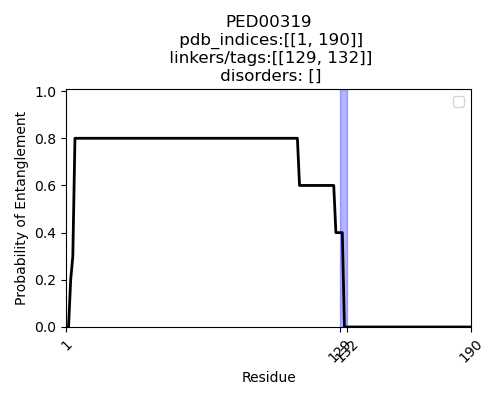

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


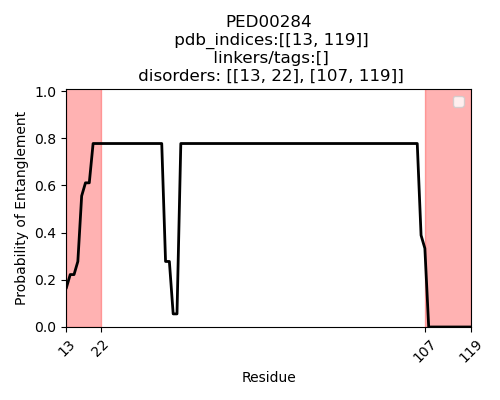

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


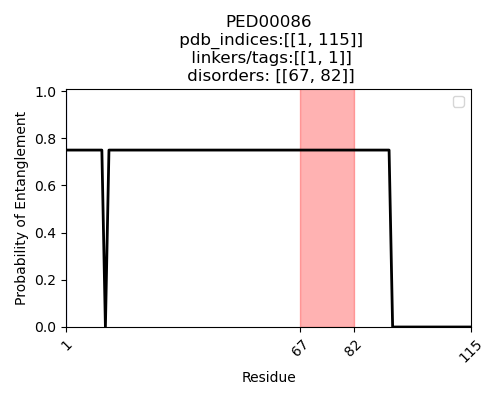

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


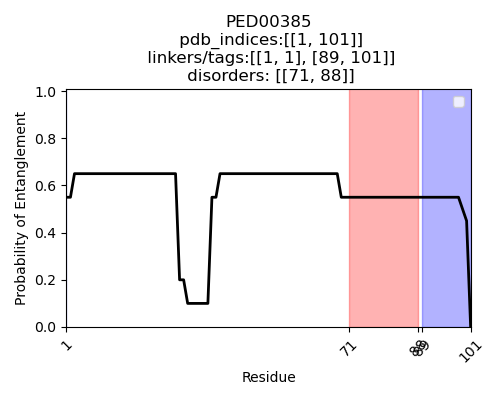

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


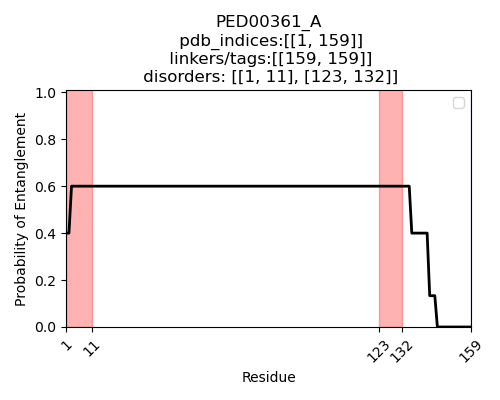

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


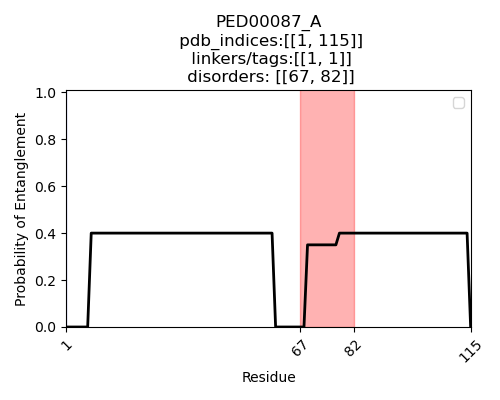

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


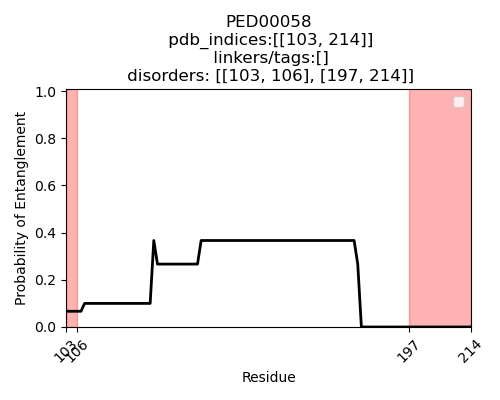

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


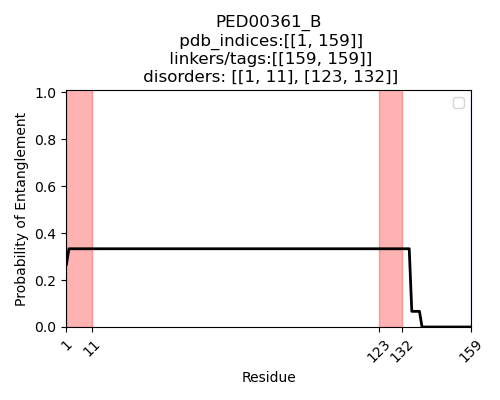

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


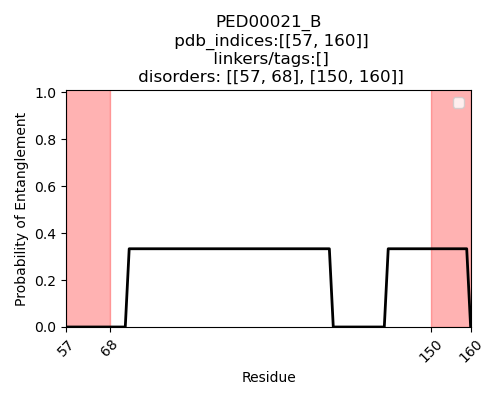

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


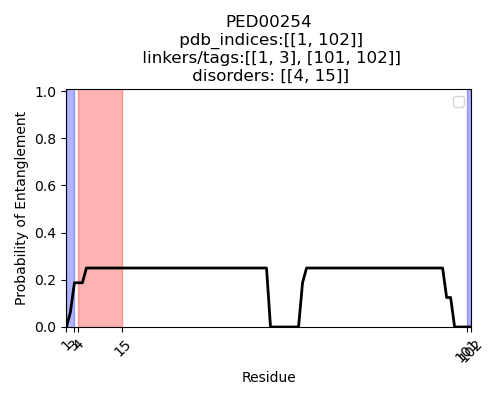

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


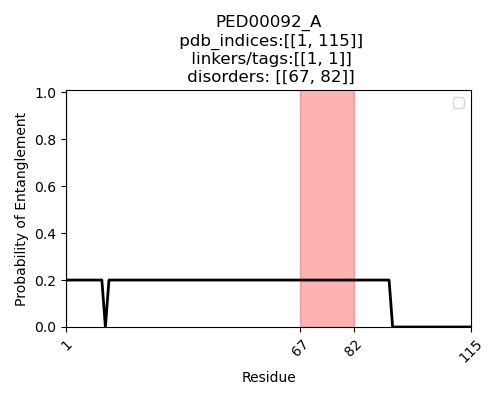

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


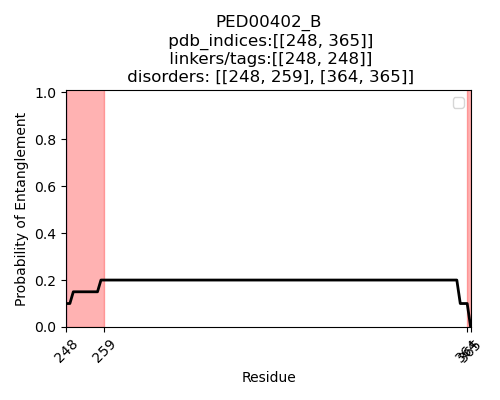

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


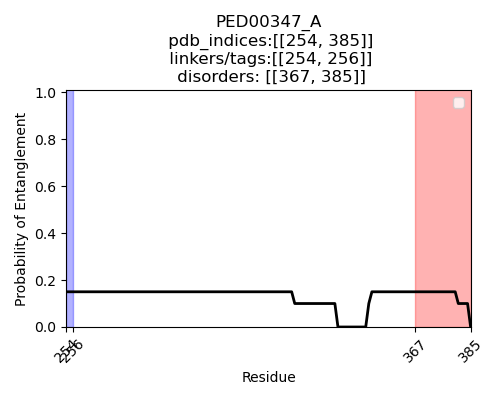

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


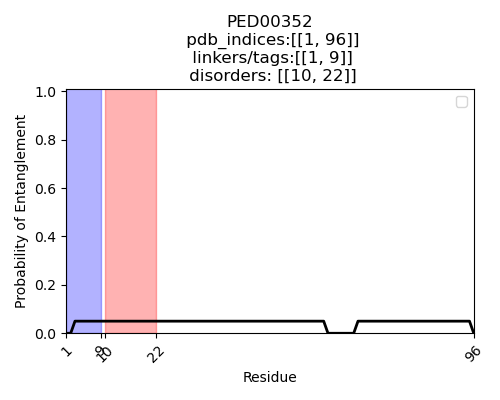

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


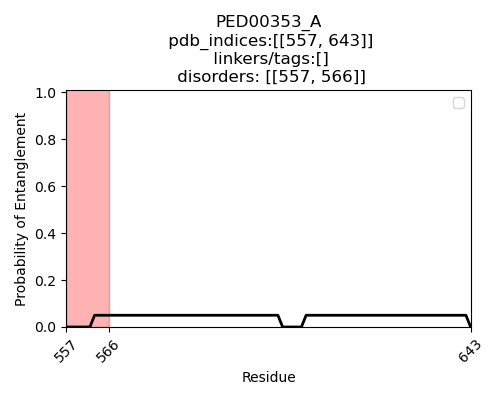

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


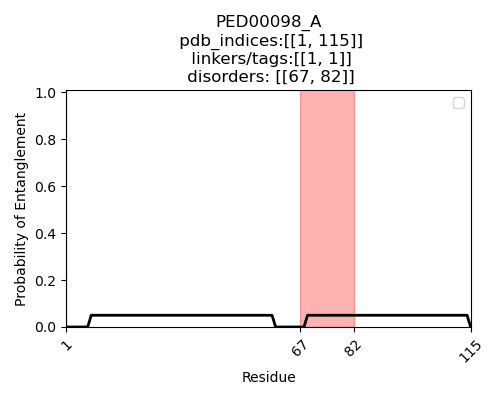

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<IPython.core.display.Javascript object>


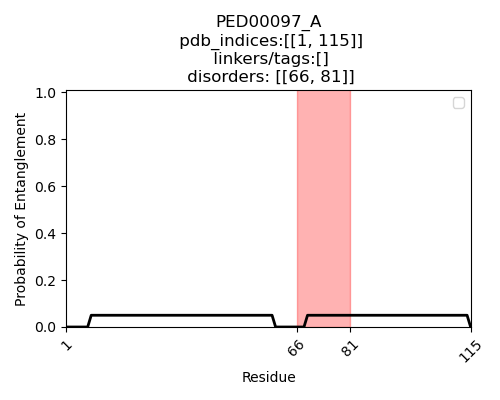

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [15]:
# generate probability of residue in entanglement for short_IDR_entangled
for PEDID in list_of_short_idr_entangled:
    plot_disorder_entanglement(PEDID)